In [1]:
import numpy as np
import sklearn
import pandas as pd
import cv2
from cv2 import imread
from google.colab.patches import cv2_imshow
import os
import matplotlib.pyplot as plt
import math
from sklearn import linear_model
import numpy.ma as ma

In [45]:
#function for averaging
# takes in image returns average for the 100x100 pixels in the middle
def average(img, channel):
  y1 = img.shape[0]//2
  y2 = y1+100

  x1 = img.shape[0]//2
  x2 = x1+100
  return np.mean(img[y1:y2, x1:x2, channel])



In [84]:
# reading in images for radiometric calibration
# computing and storing the averages
calibimgs = []
dir = '/content/drive/MyDrive/CSE264/project1/calib3/'
bgr_means = [[],[],[]]
for filename in sorted(os.listdir(dir)):
  img = imread(dir+filename)
  calibimgs.append(img)
  for i in range(3):
    bgr_means[i].append(average(img,i))

# exposure times for the images used in radiometric calibration
exp_t = [1/250, 1/160, 1/90, 1/60, 1/50, 1/45, 1/40, 1/30, 1/25, 1/20, 1/15]

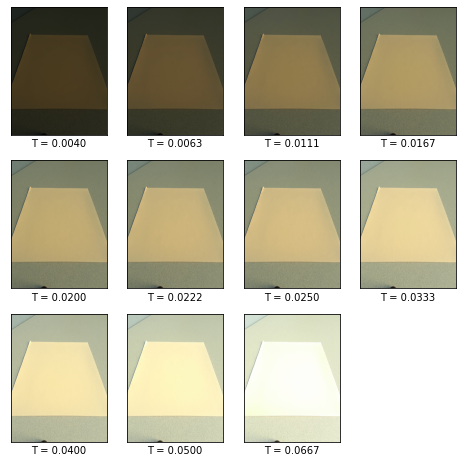

In [102]:
w=10
h=10
fig=plt.figure(figsize=(8, 8))
columns = 4
rows = 3
for i in range(1, columns*rows+1):
    if i < columns*rows:
      img = calibimgs[i-1]
      fig.add_subplot(rows, columns, i)
      plt.xticks(ticks=[])
      plt.yticks(ticks=[])
      plt.imshow(img)
      plt.xlabel("T = {:.4f}".format(exp_t[i-1]))
plt.show()

In [47]:
# getting the vector of log t and reshape it in X for fitting and plotting
log_t = np.array([math.log(t) for t in exp_t])
X = log_t.reshape(-1,1)
# getting the log value of each channel
log_b = np.array([math.log(b) for b in bgr_means[0]])
log_g = np.array([math.log(g) for g in bgr_means[1]])
log_r = np.array([math.log(r) for r in bgr_means[2]])

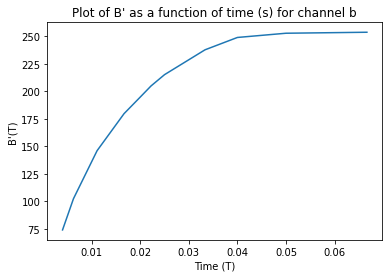

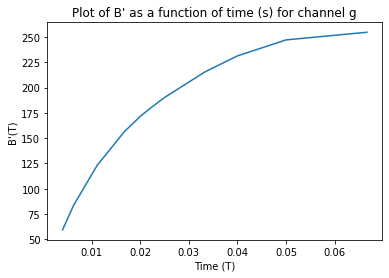

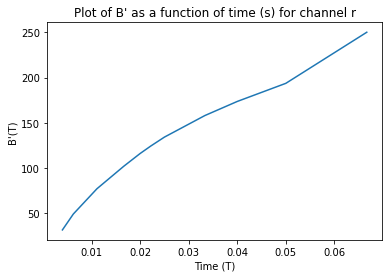

In [104]:
X = (np.array(exp_t)).reshape(-1,1)
for (i,channel) in enumerate(['b', 'g', 'r']):
  Y = bgr_means[i]
  plt.plot(X, Y)
  plt.xlabel("Time (T)")
  plt.ylabel("B\'(T)")
  plt.title("Plot of B\' as a function of time (s) for channel {}".format(channel))
  plt.show()
  print("\n")

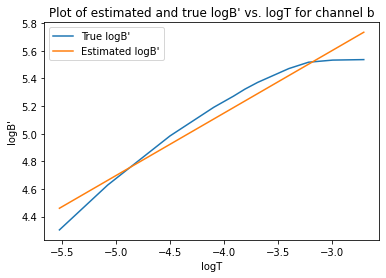

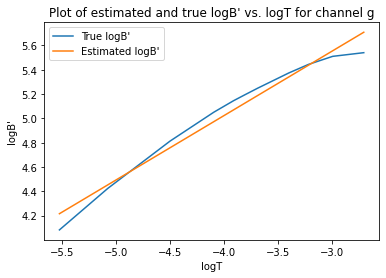

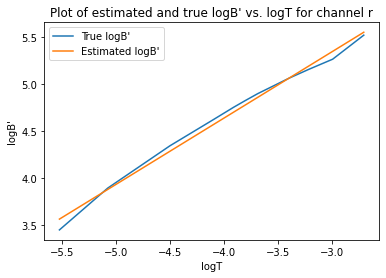

In [48]:
# estimating lambda based on log-regression and plotting
model = linear_model.LinearRegression()
bgr = [log_b, log_g, log_r]
bgr_lambdas = []
for (i,channel) in enumerate(['b', 'g', 'r']):
  Y = bgr[i]
  model.fit(X,Y)
  plt.plot(X, Y)
  plt.plot(X, model.predict(X))
  plt.legend(("True logB\'","Estimated logB\'"))
  plt.xlabel("logT")
  plt.ylabel("logB\'")
  plt.title("Plot of estimated and true logB\' vs. logT for channel {}".format(channel))
  plt.show()
  bgr_lambdas.append(1/(model.coef_))
  #print("\n")


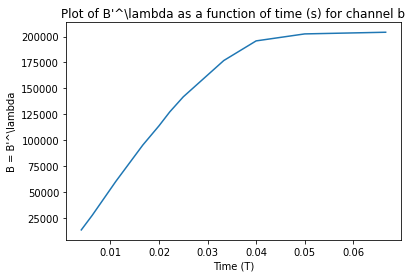

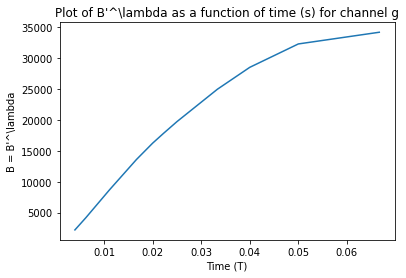

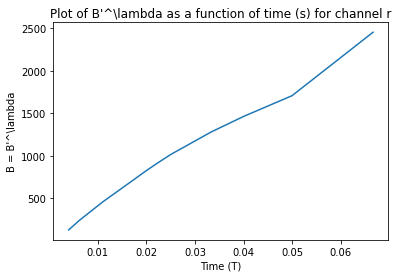

In [113]:
# plotting B'^\lambda as a function of T
X = (np.array(exp_t)).reshape(-1,1)

for (i,channel) in enumerate(['b', 'g', 'r']):
  Y = [math.pow(x,bgr_lambdas[i]) for x in bgr_means[i]]
  plt.plot(X, Y)
  plt.xlabel("Time (T)")
  plt.ylabel("B = B\'^\lambda")
  plt.title("Plot of B\'^\lambda as a function of time (s) for channel {}".format(channel))
  plt.show()
  print("\n")

In [ ]:
# lambda values for BGR channels
bgr_lambdas

[array([2.2084372]), array([1.88434938]), array([1.41329172])]

##PART 2: HDR Stack

In [117]:
# reading in the three images (stack) from dir
dir = '/content/drive/MyDrive/CSE264/project1/subset5/'

stack=[]
T = [1/3200, 1/750, 1/90]
for filename in sorted(os.listdir(dir)):
  stack.append(imread((dir+filename)))

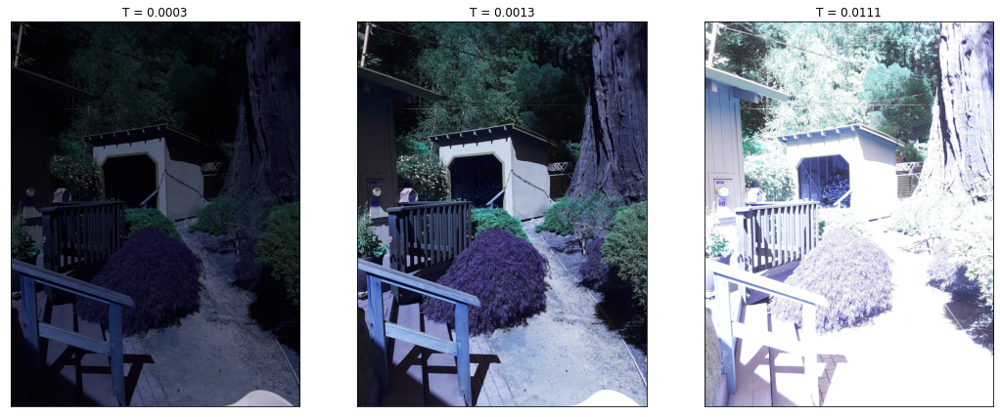

In [141]:
fig=plt.figure(figsize=(18, 12))
columns = 3
rows = 1
for i in range(1, columns*rows+1):
    fig.add_subplot(rows, columns, i)
    plt.imshow(stack[i-1])
    plt.title("T = {:.4f}".format(T[i-1]))
    plt.xticks(ticks=[])
    plt.yticks(ticks = [])
plt.show()

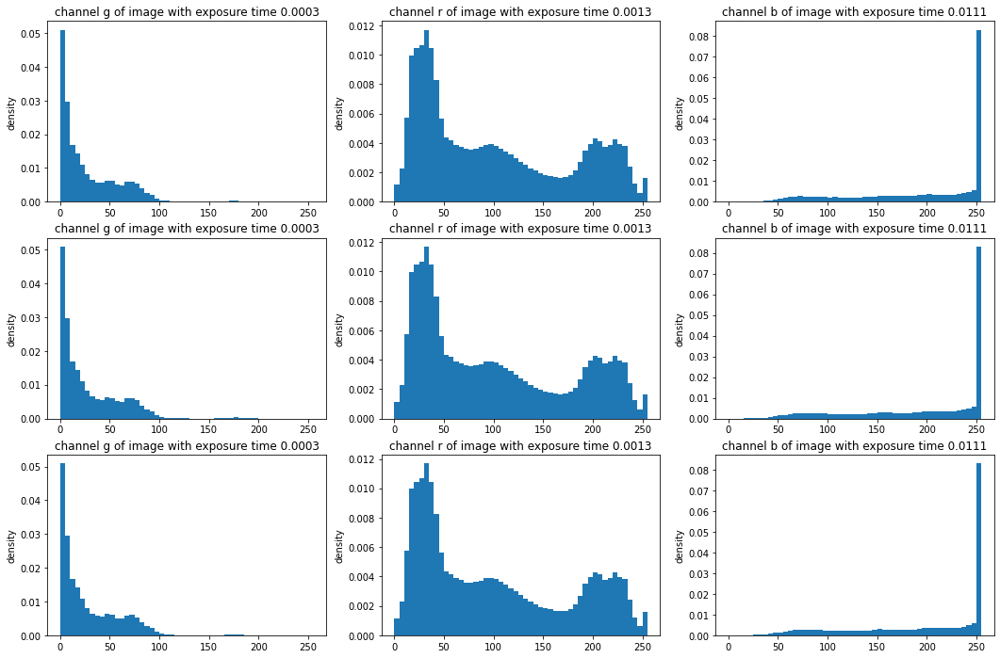

In [144]:
fig=plt.figure(figsize=(18, 12))
columns = 3
rows = 3
for i in range(1, columns*rows+1):
    fig.add_subplot(rows, columns, i)
    if i in [1,4,7]:
      img_index = 0
    elif i in [2,5,8]:
      img_index = 1
    else:
      img_index = 2
    c = i%3
    x = stack[img_index][:,:,c]
    x = x.flatten()
    plt.hist(x, 51, (0,255), density=True)
    plt.ylabel("density")
    if c == 0: channel = 'b'
    if c == 1: channel = 'g'
    if c == 2: channel = 'r'
    plt.title("channel {} of image with exposure time {:.4f}".format(channel, T[img_index]))
plt.show()

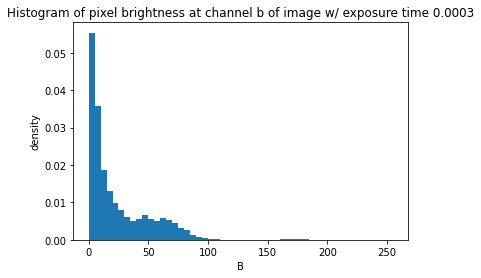

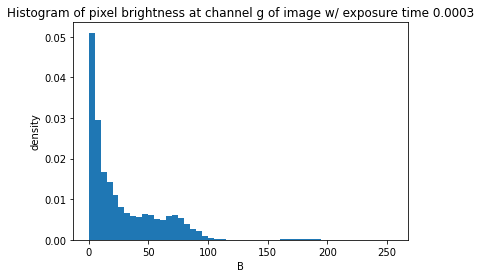

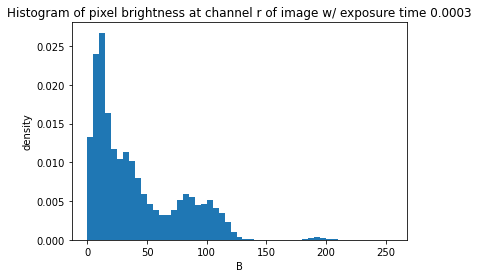

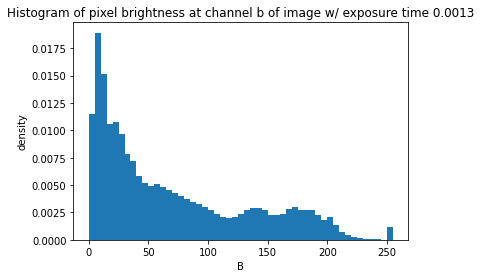

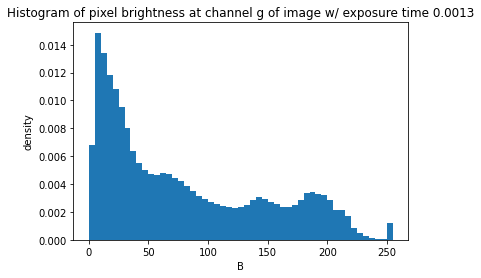

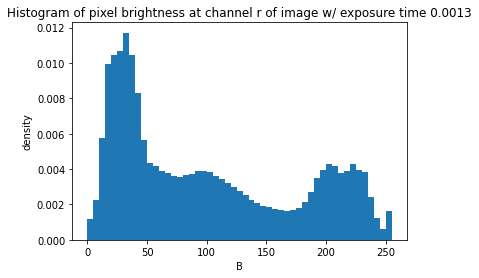

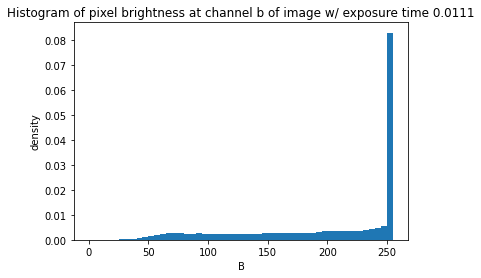

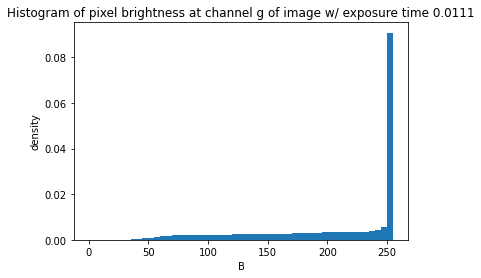

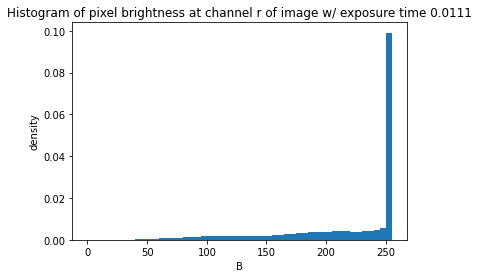

In [3]:
# plotting histograms of brightness for each channel of each image
for img_index, image in enumerate(stack):
  for i, channel in enumerate(['b', 'g', 'r']):
    x = stack[img_index][:,:,i]
    x = x.flatten()
    plt.hist(x, 51, (0,255), density=True)
    plt.xlabel("B")
    plt.ylabel("density")
    plt.title("Histogram of pixel brightness at channel {} of image w/ exposure time {:.4f}".format(channel, T[img_index]))
    plt.show()
    print("\n")


## PART 3: HDR Composite Image Creation

In [83]:
# lambdas for each channel
lambdas = [l[0] for l in bgr_lambdas]
lambdas

[2.2084372000612333, 1.8843493823776971, 1.4132917158106908]

In [50]:
def algo1(vals, T, c):
  candidates = []
  a = []
  for i, item in enumerate(sorted(vals)):
    if item < 255:
      candidates.append(math.pow(item,c))
      a.append(T[i]/T[0])
  index = candidates.index(max(candidates))
  return candidates[index]/a[index]

In [51]:
def algo2(vals, T, c):
  candidates = []
  for i, item in enumerate(sorted(vals)):
    if item < 255:
      a = T[i]/T[0]
      b = math.pow(item,c)
      candidates.append(b/a)
  return np.average(candidates)

In [52]:
# reading in the three images (stack) from dir
dir = '/content/drive/MyDrive/CSE264/project1/subset5/'

images=[]
for filename in sorted(os.listdir(dir)):
  images.append(imread((dir+filename)))

In [53]:
lambdas = [2.2084372000612333, 1.8843493823776971, 1.4132917158106908]
#images = images[2:] #comment out later
T = [1/6000, 1/1250, 1/90]
compo1 = np.zeros(images[0].shape)
compo2 = np.zeros(images[0].shape)
dim = compo1.shape
for y in range(dim[0]):
  for x in range(dim[1]):
    for c in range(dim[2]):
      vals = [image[y, x, c] for image in images]
      val1 = algo1(vals, T, lambdas[c])
      val2 = algo2(vals, T, lambdas[c])
      compo1[y, x, c ] = val1
      compo2[y, x, c ] = val2


In [80]:
lin1 = compo1.copy()
lin2 = compo2.copy()

b, g, r = 1/1.95, 1/1.59, 1/1.11
#b, g, r = 1/1.25, .97, 1.75

# b = 1/2.2084372000612333
# g = 1/1.8843493823776971
# r = 1/1.4132917158106908

lin1[:,:,0] = np.power(lin1[:,:,0],b)
lin1[:,:,1] = np.power(lin1[:,:,1],g)
lin1[:,:,2] = np.power(lin1[:,:,2],r)

lin2[:,:,0] = np.power(lin2[:,:,0],b)
lin2[:,:,1] = np.power(lin2[:,:,1],g)
lin2[:,:,2] = np.power(lin2[:,:,2],r)

# normalizing
#lin1 = 255*(lin1/np.max(lin1))

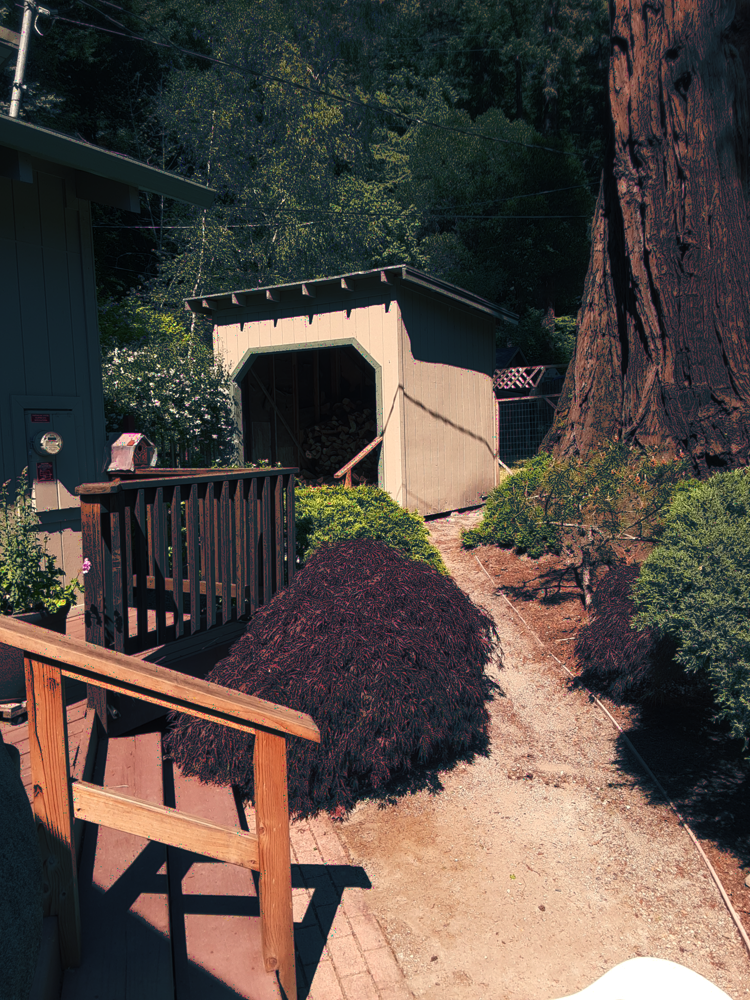

In [81]:
# algo 1
cv2_imshow(lin1)

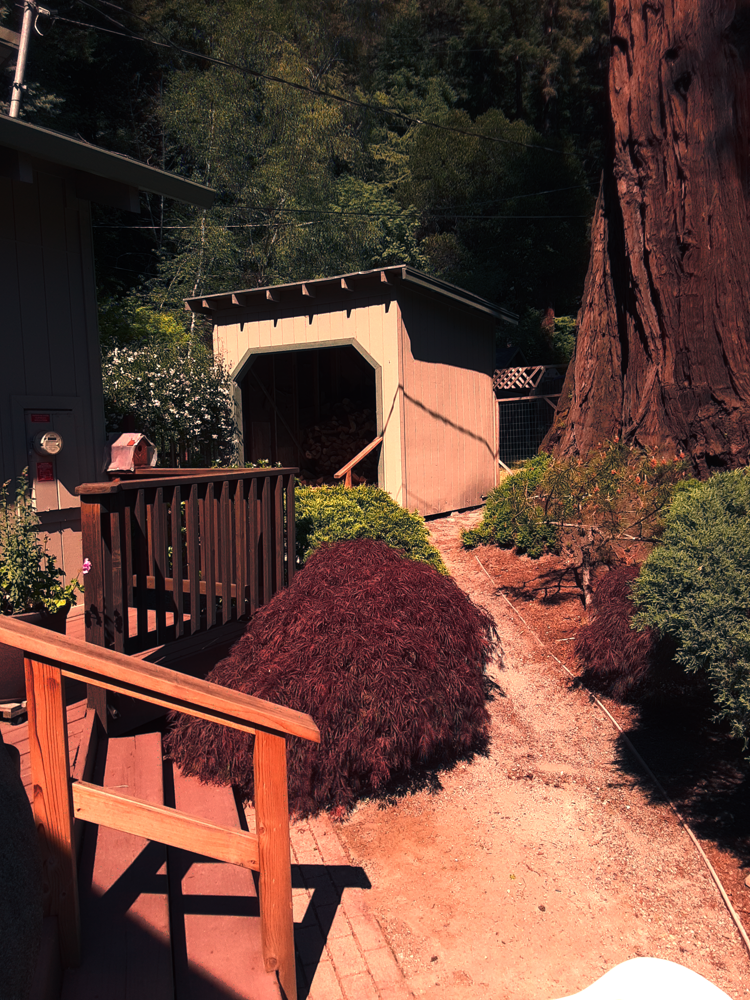

In [82]:
# algo2
cv2_imshow(lin2)

In [ ]:
def alg1(images, lambdas):
  output = images[0].copy()
  i = 0
  while i < len(images) - 1:
    output = (np.where((images[i+1] < 255), images[i+1], output)).copy()
    i+=1
  for i in range(3):
    output[:,:,i] = np.power(output[:,:,i],lambdas[i])
  return output


In [ ]:
# reading in the three images (stack) from dir
dir = '/content/drive/MyDrive/CSE264/project1/subset4/'

images=[]
#T = [1/3200, 1/750, 1/90]
for filename in sorted(os.listdir(dir)):
  images.append(imread((dir+filename)))

lambdas = [2.2084372000612333, 1.8843493823776971, 1.4132917158106908]

x = alg1(images, lambdas)
for c in range(3):
  x[:,:,c] = (np.power(x[:,:,c],(1/lambdas[c]))).copy()

#cv2_imshow(x)